## Imports

In [1]:
import os
from PIL import Image, ImageDraw
import json
import numpy as np
import matplotlib.pyplot as plt
import cv2
import pandas as pd
from copy import deepcopy

import torch
from torch import nn
from torch import utils
from torch.utils.data import DataLoader, Dataset
from torch import optim

import torchvision
from torchvision.models.detection.faster_rcnn import FastRCNNPredictor
from torchvision import transforms

import Levenshtein

print(torchvision.__version__)
device = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')

0.12.0


## DataSet definition

In [2]:
class PassportDataset(Dataset):
    """ Custom dataset for data representation """
    def __init__(self, data_folder: str):
        self.data_folder = data_folder
        self.json_file_list = [file_name for file_name in os.listdir(data_folder) if '.json' in file_name]
        self.labels_list = [_, 'surname', 'name', 'second_name']
        
    def __getitem__(self, ind: int):
        json_image_path = os.path.normpath(self.data_folder + f'/{self.json_file_list[ind]}')
        json_obj = json.load(open(json_image_path))
        
        # Load image
        try:
            img = Image.open(os.path.normpath(self.data_folder + f'/{self.json_file_list[ind][:-5] + ".jpeg"}')).convert("RGB")
        except OSError:
            img = Image.open(os.path.normpath(self.data_folder + f'/{self.json_file_list[ind][:-5] + ".png"}')).convert("RGB")
        
        
        return img, json_obj
    
    def __len__(self):
        return len(self.json_file_list)

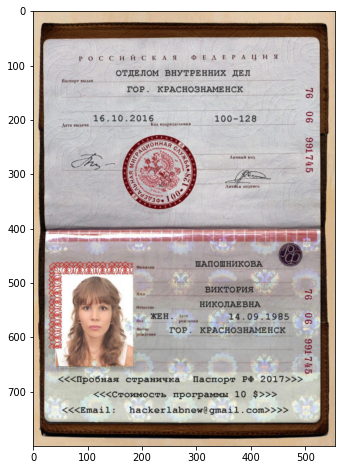

In [3]:
test_ds = PassportDataset('../input/ruspassportdataset/test/')
plt.figure(figsize=(12, 8))
plt.imshow(test_ds[1][0])
#print(test_ds[1][1])

In [4]:
class BidirectionalLSTM(nn.Module):
    def __init__(self, nIn, nHidden, nOut):
        super(BidirectionalLSTM, self).__init__()

        self.rnn = nn.LSTM(nIn, nHidden, bidirectional=True)
        self.linear = nn.Linear(nHidden * 2, nOut)

    def forward(self, input_batch):
        recurrent, _ = self.rnn(input_batch)
        T, b, h = recurrent.size()        
        
        t_rec = recurrent.view(T * b, h)

        output = self.linear(t_rec)  # [T * b, nOut]
        output = output.view(T, b, -1)

        return output


class CRNN(nn.Module):
    def __init__(self, imgH, input_channels_count, nclass, rnn_hidden_size, leakyRelu=False):
        super(CRNN, self).__init__()
        assert imgH % 16 == 0, 'imgH has to be a multiple of 16'
        
        kernel_sizes_list = [3, 3, 3, 3, 3, 3, 2]
        paddings_list = [1, 1, 1, 1, 1, 1, 0]
        strides_list = [1, 1, 1, 1, 1, 1, 1]
        channels_list = [64, 128, 256, 256, 512, 512, 512]

        cnn_seq = nn.Sequential()

        def convRelu(i, batchNormalization=False):
            nIn = input_channels_count if i == 0 else channels_list[i - 1]
            nOut = channels_list[i]
            
            cnn_seq.add_module('conv{0}'.format(i),
                           nn.Conv2d(nIn, nOut, kernel_sizes_list[i], strides_list[i], paddings_list[i]))
            
            print(nIn, nOut, kernel_sizes_list[i], strides_list[i], paddings_list[i])
            
            if batchNormalization:
                cnn_seq.add_module('batchnorm{0}'.format(i), nn.BatchNorm2d(nOut))
            if leakyRelu:
                cnn_seq.add_module('relu{0}'.format(i),
                               nn.LeakyReLU(0.2, inplace=True))
            else:
                cnn_seq.add_module('relu{0}'.format(i), nn.ReLU(True))

        convRelu(0)
        cnn_seq.add_module('pooling{0}'.format(0), nn.MaxPool2d(2, 2))  # 64x16x64 (Channels, Height, Width)
        convRelu(1)
        cnn_seq.add_module('pooling{0}'.format(1), nn.MaxPool2d(2, 2))  # 128x8x32
        convRelu(2, True)
        convRelu(3)
        cnn_seq.add_module('pooling{0}'.format(2),
                       nn.MaxPool2d((2, 2), (2, 1), (0, 1)))  # 256x4x16
        convRelu(4, True)
        convRelu(5)
        cnn_seq.add_module('pooling{0}'.format(3),
                       nn.MaxPool2d((2, 2), (2, 1), (0, 1)))  # 512x2x16
        convRelu(6, True)  # 512x1x16

        self.cnn_module = cnn_seq
        self.rnn = nn.Sequential(
            BidirectionalLSTM(512, rnn_hidden_size, rnn_hidden_size),
            BidirectionalLSTM(rnn_hidden_size, rnn_hidden_size, nclass + 1))

    def forward(self, img_batch):
        # conv features
        conv = self.cnn_module(img_batch)
        batch_size, channels_count, img_height, img_width = conv.size()
        
        assert img_height == 1, "the height of conv must be 1"
        
        conv = conv.squeeze(2)

        conv = conv.permute(2, 0, 1)  # [w, b, c]

        # rnn features
        output = self.rnn(conv)

        return output
    

def ctc_decode(model_answer: torch.Tensor, alphabet: str, blank_symb: int) -> list:    
    raw_text_ans = ['-' if item == blank_symb else alphabet[item - 1] for item in model_answer]
    
    prev_rep = 0
    
    result = [raw_text_ans[0]]
    
    for cur_pos in range(1, len(raw_text_ans)):        
        if raw_text_ans[cur_pos] != raw_text_ans[prev_rep]:
            result.append(raw_text_ans[cur_pos])
            prev_rep = cur_pos        
    
    return ''.join(filter(lambda x: x != '-', result))

## Создание модели, которая объединит детектор и модуль распознавания

In [5]:
class OCRModel:
    def __init__(self, detector: nn.Module, recognizer: nn.Module, alphabet: str):
        self.detector = detector
        self.recognizer = recognizer
        self.img_convert = transforms.ToTensor()
        self.alphabet = alphabet
        
        self.detector.to(device)
        self.recognizer.to(device)
        
    def forward(self, img_batch):
        prep_img_batch = list((self.img_convert(img).to(device) for img in img_batch))
        # Send images to detector
        self.detector.eval()
        detector_pred = self.detector(prep_img_batch)
        
        # List of boxes and labels for every image
        batch_model_answer = list()
        
        for temp_image, temp_det_prediction in zip(img_batch, detector_pred):
            # Apply non maximum suppression
            kept_ind = torchvision.ops.nms(temp_det_prediction['boxes'], temp_det_prediction['scores'], 0.4)            
            
            temp_det_prediction['boxes'] = temp_det_prediction['boxes'][kept_ind]
            temp_det_prediction['labels'] = temp_det_prediction['labels'][kept_ind]
            temp_det_prediction['scores'] = temp_det_prediction['scores'][kept_ind]
            
            conf_ans_ind = temp_det_prediction['scores'] >= 0.65
            
            temp_det_prediction['boxes'] = temp_det_prediction['boxes'][conf_ans_ind]
            temp_det_prediction['labels'] = temp_det_prediction['labels'][conf_ans_ind]
            temp_det_prediction['scores'] = temp_det_prediction['scores'][conf_ans_ind]
            
            temp_image = np.array(temp_image)
            # Convert RGB to BGR 
            temp_image = temp_image[:, :, ::-1].copy()
            
            temp_image_boxes_list = list()
            
            for box_ind, (box, label) in enumerate(zip(temp_det_prediction['boxes'], temp_det_prediction['labels'])):
                # unpack the bounding box
                x0 = int(box[0])
                y0 = int(box[1])
                x1 = int(box[2])
                y1 = int(box[3])
                
                # Crop image
                cropped_image = temp_image[y0: y1, x0: x1]
        
                # Convert to PIL
                cropped_image = cv2.cvtColor(cropped_image, cv2.COLOR_BGR2RGB)
                cropped_image = Image.fromarray(cropped_image)
                cropped_image = cropped_image.convert('L')
                
                # Image resize
                recog_inp_height = 32
                
                ratio = recog_inp_height / cropped_image.size[1]
        
                new_height = recog_inp_height
                new_width = int(cropped_image.size[0] * ratio)
                
                cropped_image = cropped_image.resize((new_width, new_height), Image.Resampling.BILINEAR)      
                
                # Send cropped image to the recognizer
                cropped_image = self.img_convert(cropped_image)                
                cropped_image = torch.unsqueeze(cropped_image, 0)
                cropped_image = cropped_image.to(device)
                
                logits = self.recognizer(cropped_image)
                
                # Decode model output
                log_probs = torch.nn.functional.log_softmax(logits, dim=2)
                symb_predictions = torch.argmax(log_probs, dim=2)
                word_prediction = ctc_decode(symb_predictions, self.alphabet, 0)
                
                temp_image_boxes_list.append([temp_det_prediction['boxes'][box_ind].tolist(), temp_det_prediction['labels'][box_ind].item(), word_prediction])
                
            batch_model_answer.append(temp_image_boxes_list)
            torch.cuda.empty_cache()
        
        # Return boxes, labels and text
        return batch_model_answer
        
    def backward(self):
        pass

In [6]:
def collate_fn(batch):
    return tuple(zip(*batch))

In [7]:
import pickle

# Get models from binary files
detection_model = pickle.load(open('/kaggle/input/fasterrcnn-and-crnn-models/trained_model_00_25_1671966049.bin', mode='rb'))
crnn_model = pickle.load(open('/kaggle/input/fasterrcnn-and-crnn-models/recog_model.bin', mode='rb'))

In [8]:
# Model initialization

torch.cuda.empty_cache()

recog_m = deepcopy(crnn_model)
det_m = deepcopy(detection_model)

data_loader = DataLoader(test_ds, batch_size=2, num_workers=1, collate_fn=collate_fn)

model = OCRModel(det_m, recog_m, 'АБВГДЕЁЖЗИЙКЛМНОПРСТУФХЦЧШЩЪЫЬЭЮЯ ')

## Демонстрация работы

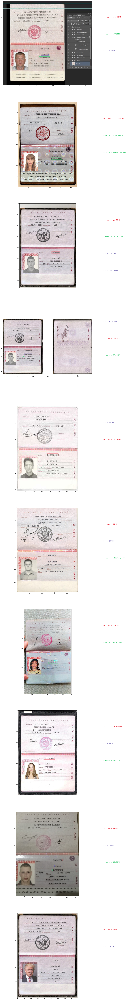

In [9]:
fig, axes = plt.subplots(len(test_ds), 2, gridspec_kw={'width_ratios': [4, 1]}, figsize=(24, len(test_ds) * 20))

plt_ind = 0

colors = [
    '#E83845',
    '#746AB0',
    '#37C871',
]

class_labels = [
    'Фамилия',
    'Имя',
    'Отчество', 
]

for images, targets in data_loader:
    model_ans = model.forward(images)
    
    for img_ind, img_predictions in enumerate(model_ans):
        temp_draw = ImageDraw.Draw(images[img_ind])
        # Add boxes
        for box_ind, (box, label, text) in enumerate(img_predictions, 1):
            temp_draw.rectangle(box, outline=colors[label - 1])
            # Plot text on the right sidebar
            axes[plt_ind][1].text(0, 1 - box_ind / 5, 
                                  f'{class_labels[label - 1]} -> {text}', fontsize=15, transform=axes[plt_ind, 1].transAxes, color=colors[label - 1])
            axes[plt_ind][1].axis('off')
        # Plot image with boxes
        axes[plt_ind][0].imshow(images[img_ind])
        plt_ind += 1

У данной системы есть множество точек для улучшения качества:
* Увеличение датасетов для каждого модуля
* Переразметить датасет для детекции, тк box'ы расположились очень близко к словам и модуль распознавания делает ошибки
* Использование аугментаций данных
* Попробовать в качестве детектора YOLO
* Поэкспериментировать с размерами свёрточных слоёв для CRNN(можно оптимизировать под русский язык)
* Изменить наборы anchor box'ов под поиск текстов(нужны в основном длинные и невысокие)